In [1]:
import os
import sys
import inspect
import itertools

import numpy as np
from numpy import ma
import xarray as xr
from datetime import datetime, timedelta
from dateutil.parser import parse as parse_date

import matplotlib.pyplot as plt
from matplotlib import animation

# code from https://stackoverflow.com/questions/279237/import-a-module-from-a-relative-path?lq=1#comment15918105_6098238 to load a realitive folde from a notebook
# realpath() will make your script run, even if you symlink it :)
cmd_folder = os.path.realpath(os.path.abspath(os.path.split(inspect.getfile( inspect.currentframe() ))[0]))
if cmd_folder not in sys.path:
    sys.path.insert(0, cmd_folder)

# from utils import io, abi, glm, nexrad
from utils import io, abi

In [2]:
goes_data_path = './data/GOES16'

In [3]:
os.environ['GOOGLE_APPLICATION_CREDENTIALS'] = '/Users/jonesw/Downloads/dcc-detect-4e11a4adbc07.json'

In [162]:
dates = [datetime(2020,10,8,12) + timedelta(hours=i) for i in range(10)]
abi_files = list(sum([sorted(io.find_abi_files(date, satellite=16, product='MCMIP', view='M1', mode=6, 
                                        save_dir=goes_data_path, 
                                        replicate_path=True, check_download=True, 
                                        n_attempts=1, download_missing=True))
                  for date in dates],[]))
             
len(abi_files)

600

In [144]:
goes_ds = xr.open_dataset(abi_files[180])

In [6]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature

In [7]:
img_proj = ccrs.Geostationary(satellite_height=goes_ds.goes_imager_projection.perspective_point_height,
                              central_longitude=goes_ds.goes_imager_projection.longitude_of_projection_origin,
                              sweep_axis=goes_ds.goes_imager_projection.sweep_angle_axis)

In [8]:
img_proj

In [9]:
h = goes_ds.goes_imager_projection.perspective_point_height
img_extent=(goes_ds.x[0]*h, goes_ds.x[-1]*h, goes_ds.y[-1]*h, goes_ds.y[0]*h)

In [45]:
def get_abi_convective_rgb(mcmip_ds):
    R = mcmip_ds.CMI_C08 - mcmip_ds.CMI_C10
    R = np.minimum(R, 5)
    R = np.maximum(R, -35)
    R = (R+35)/40
    
    G = mcmip_ds.CMI_C07 - mcmip_ds.CMI_C13
    G = np.minimum(G, 60)
    G = np.maximum(G, -5)
    G = (G+5)/65
    G = np.power(G, 0.5)
    
    B = mcmip_ds.CMI_C05 - mcmip_ds.CMI_C02
    B = np.minimum(B, 0.25)
    B = np.maximum(B, -0.75)
    B = (B+0.75)/1.0
    
    RGB = np.maximum(np.minimum(np.stack([R, G, B], -1), 1), 0)
    return RGB

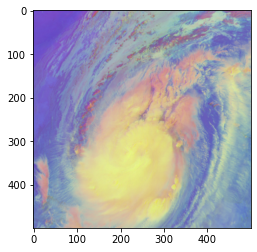

In [46]:
plt.imshow(get_abi_convective_rgb(test_ds))

In [12]:
def get_sza(dt, lat, lon):
    srd = (dt-datetime(dt.year,1,1)).days+1
    hour = dt.hour
    minute = dt.minute
    utc=srd + hour/24.0 + float(minute/(24.0*60.0))
    #print('UTC = ',utc)
    
    dim=1
    
    #calculate the number of days since the 1.1. of the specific year
    daynum=np.floor(utc)+1
    #print(daynum)
    
    #calculate the relative SUN-earth distance for the given day
    #resulting from the elliptic orbit of the earth
    eta = 2.*np.pi*daynum/365.
    fluxfac = 1.000110+0.034221*np.cos(eta)+0.000719*np.cos(2.*eta)+0.001280*np.sin(eta)+0.000077*np.sin(2.*eta)
    dist = 1./np.sqrt(fluxfac)
    
    #calculate the solar declination for the given day
    #the declination varies due to the fact, that the earth rotation axis
    #is not perpendicular to the ecliptic plane
    delta = 0.006918-0.399912*np.cos(eta)-0.006758*np.cos(2.*eta)-0.002697*np.cos(3.*eta)+0.070257*np.sin(eta)+0.000907*np.sin(2.*eta)+0.001480*np.sin(3.*eta)
    
    #equation of time, used to compensate for the earth's elliptical orbit
    #around the sun and its axial tilt when calculating solar time
    #eqt is the correction in hours
    et = 2.*np.pi*daynum/366.
    eqt = 0.0072*np.cos(et)-0.0528*np.cos(2.*et)-0.0012*np.cos(3.*et)-0.1229*np.sin(et)-0.1565*np.sin(2.*et)-0.0041*np.sin(3.*et)
    
    #calculate the solar zenith angle
    #dtr = !pi/180. ; degrees to radian conversion factor
    time = (utc+1.-daynum)*24 # time in hours
    omega = np.radians((360./24.)*(time+lon/15.+eqt-12.))
    sunh = np.sin(delta)*np.sin(np.radians(lat))+np.cos(delta)*np.cos(np.radians(lat))*np.cos(omega)
    
    #IF (sunh lt -1.0) THEN sunh=-1.0
    #IF (sunh gt 1.0) THEN sunh=1.0
    solel = np.arcsin(sunh)
    sza = np.pi/2.-solel
    
    #Solar azimuth added by yaswant
    azi=(np.sin(delta)*np.cos(np.radians(lat))-np.cos(delta)*np.sin(np.radians(lat))*np.cos(omega))/np.cos(np.pi/2.-sza)
    
    #IF (azi lt -1.0) THEN azi=-1.0
    #IF (azi gt 1.0) THEN azi=1.0
    azim = np.arccos(azi)
    #print('Solar Azimuth (in degs) :        ',r2d(azim) )
    #print('Solar Zenith Angle (in degs) :',r2d(sza) )
    #print('Solar Elevation Angle (in degs) :',r2d(solel) )
    #print('Hour Angle (in degrees) :           ',r2d(omega) )
    #Function return is solar zenith in radians
    return sza


In [13]:
def get_abi_deep_cloud_rgb(mcmip_ds, max_cossza=0.06):
    date = parse_date(str(mcmip_ds.t.data))
    lats, lons = abi.get_abi_lat_lon(mcmip_ds)
    cossza = np.cos(solar(date, lats, lons))
    
    R = mcmip_ds.CMI_C08 - mcmip_ds.CMI_C13
    R = np.minimum(R, 5)
    R = np.maximum(R, -35)
    R = (R+35)/40
    
    G = mcmip_ds.CMI_C02/np.maximum(cossza, max_cossza)
    G = np.minimum(G, 1.)
    G = np.maximum(G, 0.7)
    G = (G-0.7)/0.3
    
    B = mcmip_ds.CMI_C13
    B = np.minimum(B, 292.6)
    B = np.maximum(B, 243.6)
    B = (B-243.6)/(292.6-243.6)
    
    RGB = np.maximum(np.minimum(np.stack([R, G, B], -1)*(np.minimum(cossza, max_cossza)/max_cossza)[...,np.newaxis], 1), 0)
    return RGB

In [136]:
from importlib import reload; reload(abi)

<module 'utils.abi' from '/Users/jonesw/python/example_notebooks/utils/abi.py'>

In [137]:
from utils import geo; reload(geo)

<module 'utils.geo' from '/Users/jonesw/python/example_notebooks/utils/geo.py'>

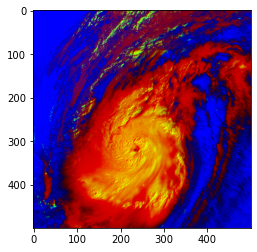

In [138]:
plt.imshow(abi.get_abi_deep_cloud_rgb(goes_ds))

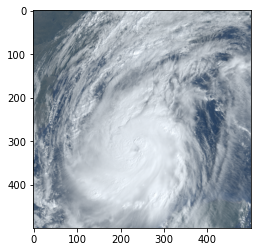

In [147]:
plt.imshow(abi.get_abi_rgb(goes_ds, correct_sza=False))

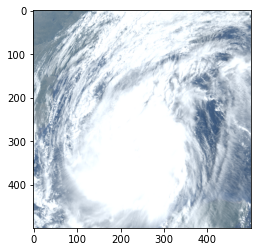

In [151]:
plt.imshow(abi.get_abi_rgb(goes_ds, correct_sza=True, contrast=100))

In [139]:
import warnings
warnings.filterwarnings("ignore")



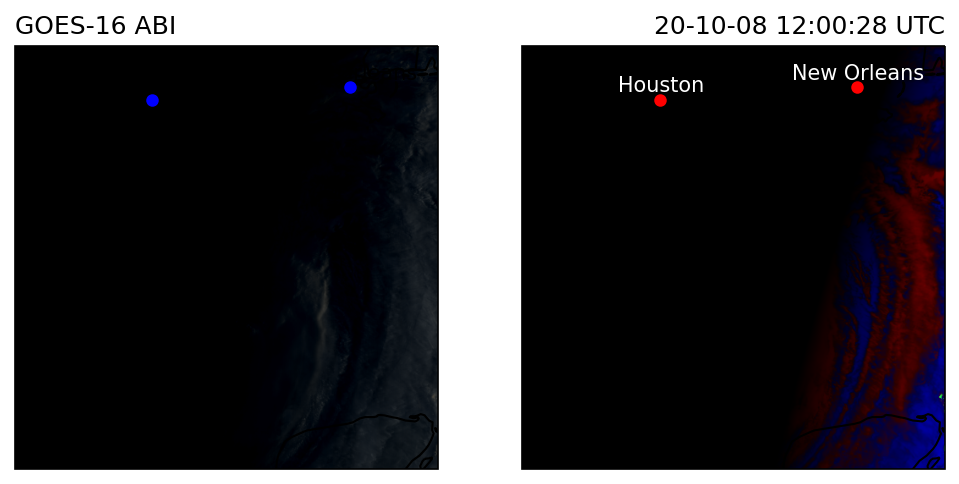

In [163]:
test_ds = xr.open_dataset(abi_files[0])
h = test_ds.goes_imager_projection.perspective_point_height
img_extent=(test_ds.x[0]*h, test_ds.x[-1]*h, test_ds.y[-1]*h, test_ds.y[0]*h)
fig = plt.figure(dpi=150, figsize=(8,4))
# plt.gcf().text(0.125, 0.95, 'GOES-16 ABI M1', ha='left')

ax = plt.subplot(1,2,1,projection=img_proj)
i1 = ax.imshow(abi.get_abi_rgb(test_ds, correct_sza=False), extent=img_extent)
ax.coastlines(resolution='50m', color='black', linewidth=1)
ax.add_feature(cfeature.BORDERS, color='black', linewidth=1)
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
ax.add_feature(states_provinces, edgecolor='black')
ax.plot(-95.3698, 29.7604, 'bo', markersize=5, transform=ccrs.Geodetic())
ax.text(-95.3698, 29.9604, 'Houston', ha='center', transform=ccrs.Geodetic())
ax.plot(-90.0715, 29.9511, 'bo', markersize=5, transform=ccrs.Geodetic())
ax.text(-90.0715, 30.1511, 'New Orleans', ha='center', transform=ccrs.Geodetic())
ax.set_title('GOES-16 ABI', loc='left')

ax2 = plt.subplot(1,2,2,projection=img_proj)
i2 = ax2.imshow(get_abi_deep_cloud_rgb(test_ds), extent=img_extent)
ax2.coastlines(resolution='50m', color='black', linewidth=1)
ax2.add_feature(cfeature.BORDERS, color='black', linewidth=1)
ax2.add_feature(states_provinces, edgecolor='black')
ax2.plot(-95.3698, 29.7604, 'ro', markersize=5, transform=ccrs.Geodetic())
ax2.text(-95.3698, 29.9604, 'Houston', color='white', ha='center', transform=ccrs.Geodetic())
ax2.plot(-90.0715, 29.9511, 'ro', markersize=5, transform=ccrs.Geodetic())
ax2.text(-90.0715, 30.1511, 'New Orleans', color='white', ha='center', transform=ccrs.Geodetic())
text = ax2.set_title(parse_date(str(test_ds.t.data)).strftime('%y-%m-%d %H:%M:%S UTC'), loc='right')

img_shape = (500,500,3)
# text = plt.suptitle(parse_date(str(test_ds.t.data)).strftime('%y-%m-%d %H:%M:%S UTC'), x=0.9, y=0.98, ha='right')



In [164]:
# init function: returns the plotting handles that will be modified
def init():
    i1.set_data(np.zeros(img_shape))
    i2.set_data(np.zeros(img_shape))
    text.set_text('')
    return [i1, i2, text]

# animation function: modifies the data of the plot handles according to a frame index
def animate(i):
    with xr.open_dataset(abi_files[i]) as goes_ds:
        print('%3s'%i, end='\r')
        i1.set_data(abi.get_abi_rgb(goes_ds))
        i2.set_data(get_abi_deep_cloud_rgb(goes_ds))
        text.set_text(parse_date(str(goes_ds.t.data)).strftime('%y-%m-%d %H:%M:%S UTC'))
    return [i1, i2, text]

anim = animation.FuncAnimation(fig, animate, init_func=init, frames=len(abi_files), 
                               interval=50, blit=True)


In [158]:
# Embed using ipython
from IPython.display import HTML, Image, display
HTML(anim.to_jshtml())

In [165]:
anim.save('./delta_20201008.mp4', bitrate=3000)

In [108]:
anim.save?